# TP 1 - Parte 1

In [1]:

from tp1 import util as utils

#### 1. Implementar el algoritmo White Patch para librarnos de las diferencias de color de iluminación.

Primero, vamos a observar las imágenes que debemos modificar:

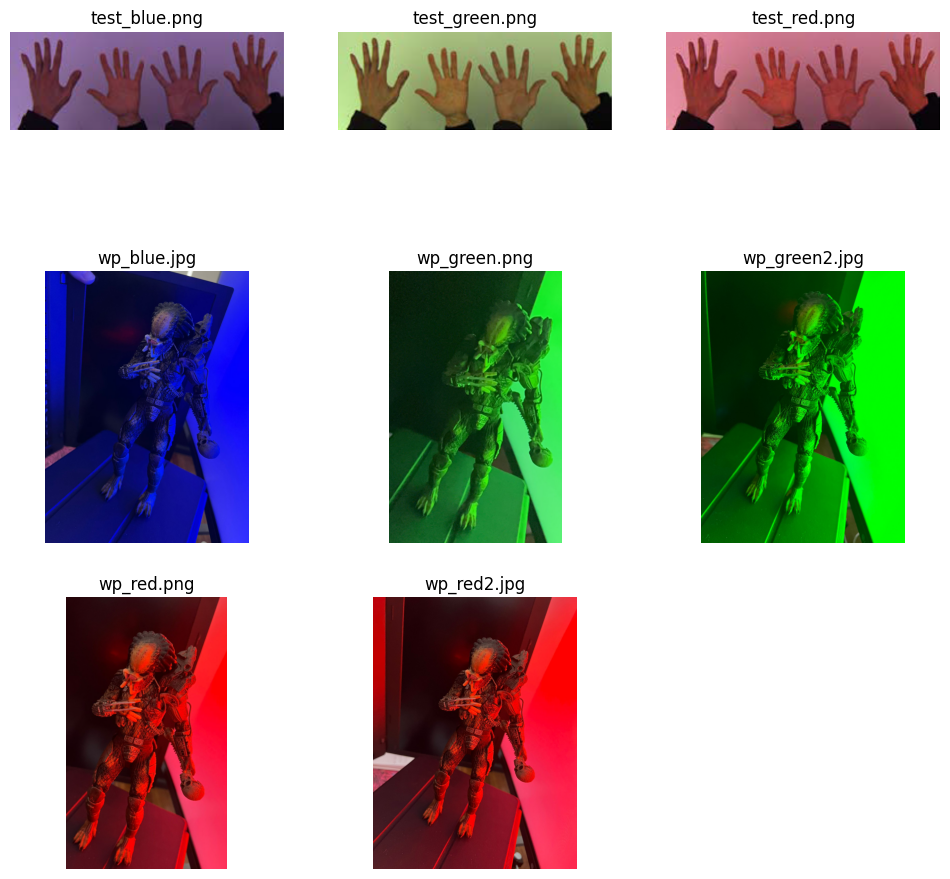

In [2]:
input_folder = 'material/parte_1/original'
utils.plot_imgs_from(input_folder)

Se puede apreciar como cada imágen tiene colores predominantes que trataremos de equalizar con white patch

test_blue.png: R[100]=165.00, G[100]=138.00, B[100]=200.00
test_green.png: R[100]=210.00, G[100]=250.00, B[100]=171.00
test_red.png: R[100]=247.00, G[100]=157.00, B[100]=175.00
wp_blue.jpg: R[100]=255.00, G[100]=255.00, B[100]=255.00
wp_green.png: R[100]=126.00, G[100]=252.00, B[100]=155.00
wp_green2.jpg: R[100]=170.00, G[100]=255.00, B[100]=172.00
wp_red.png: R[100]=255.00, G[100]=134.00, B[100]=122.00
wp_red2.jpg: R[100]=255.00, G[100]=201.00, B[100]=203.00


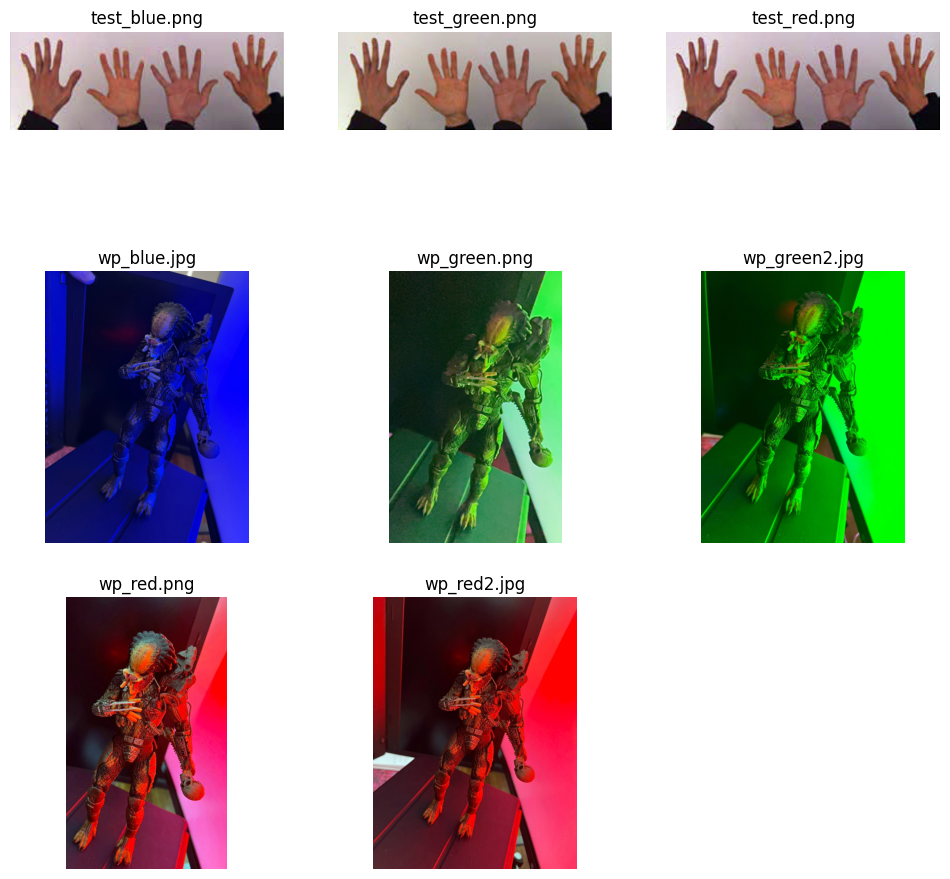

In [3]:
utils.apply_white_patch_to(input_folder, 'material/parte_1/white_patch/100')
utils.plot_imgs_from('material/parte_1/white_patch/100')

#### 2. Mostrar los resultados obtenidos y analizar las posibles fallas (si es que las hay) en el caso de White patch.

Podemos observar que se resuelve bastante bien el problema del iluminado en las imágenes de las manos, obteniendo para los 3 casos un a imagen en la que ya prácticamente no se nota una iluminación con un color en particular, pero las imágenes del alien no presentan prácticamente mejoras, y esto se debe a los altos valores máximos en ciertos canales para estas imágenes. Por tanto, amerita aplicar un percentil para mejorar la corrección de la iluminación.

In [4]:
utils.apply_white_patch_to(input_folder, 'material/parte_1/white_patch/90', percentile=90)

test_blue.png: R[90]=140.00, G[90]=107.00, B[90]=159.00
test_green.png: R[90]=176.00, G[90]=201.00, B[90]=134.00
test_red.png: R[90]=209.00, G[90]=124.00, B[90]=145.00
wp_blue.jpg: R[90]=44.00, G[90]=41.00, B[90]=245.00
wp_green.png: R[90]=64.00, G[90]=233.00, B[90]=80.00
wp_green2.jpg: R[90]=9.00, G[90]=254.00, B[90]=9.00
wp_red.png: R[90]=253.00, G[90]=49.00, B[90]=65.00
wp_red2.jpg: R[90]=254.00, G[90]=49.00, B[90]=77.00


In [5]:
utils.apply_white_patch_to(input_folder, 'material/parte_1/white_patch/95', percentile=95)

test_blue.png: R[95]=148.00, G[95]=116.00, B[95]=173.00
test_green.png: R[95]=186.00, G[95]=218.00, B[95]=144.00
test_red.png: R[95]=223.00, G[95]=136.00, B[95]=158.00
wp_blue.jpg: R[95]=56.00, G[95]=51.00, B[95]=252.00
wp_green.png: R[95]=80.00, G[95]=237.00, B[95]=113.00
wp_green2.jpg: R[95]=30.00, G[95]=255.00, B[95]=24.00
wp_red.png: R[95]=255.00, G[95]=58.00, B[95]=90.00
wp_red2.jpg: R[95]=255.00, G[95]=60.00, B[95]=90.00


In [6]:
utils.apply_white_patch_to(input_folder, 'material/parte_1/white_patch/97', percentile=97.5)

test_blue.png: R[97.5]=151.00, G[97.5]=120.00, B[97.5]=176.00
test_green.png: R[97.5]=189.00, G[97.5]=225.00, B[97.5]=146.00
test_red.png: R[97.5]=227.00, G[97.5]=139.00, B[97.5]=160.00
wp_blue.jpg: R[97.5]=77.00, G[97.5]=65.00, B[97.5]=253.00
wp_green.png: R[97.5]=86.00, G[97.5]=241.00, B[97.5]=118.00
wp_green2.jpg: R[97.5]=53.00, G[97.5]=255.00, B[97.5]=39.00
wp_red.png: R[97.5]=255.00, G[97.5]=64.00, B[97.5]=98.00
wp_red2.jpg: R[97.5]=255.00, G[97.5]=70.00, B[97.5]=99.00


In [7]:
utils.apply_white_patch_to(input_folder, 'material/parte_1/white_patch/99', percentile=99)

test_blue.png: R[99]=153.00, G[99]=122.00, B[99]=180.00
test_green.png: R[99]=193.00, G[99]=230.00, B[99]=150.00
test_red.png: R[99]=230.00, G[99]=143.00, B[99]=163.00
wp_blue.jpg: R[99]=117.00, G[99]=86.00, B[99]=254.00
wp_green.png: R[99]=88.00, G[99]=244.00, B[99]=120.00
wp_green2.jpg: R[99]=70.00, G[99]=255.00, B[99]=56.00
wp_red.png: R[99]=255.00, G[99]=74.00, B[99]=102.00
wp_red2.jpg: R[99]=255.00, G[99]=119.00, B[99]=119.00


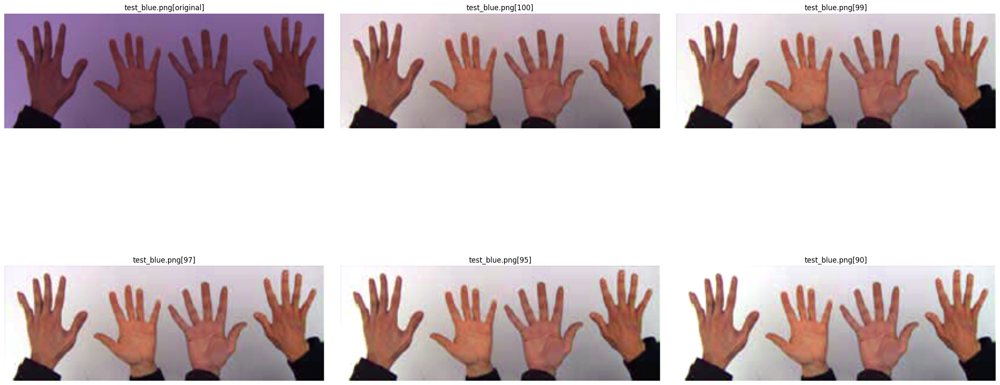

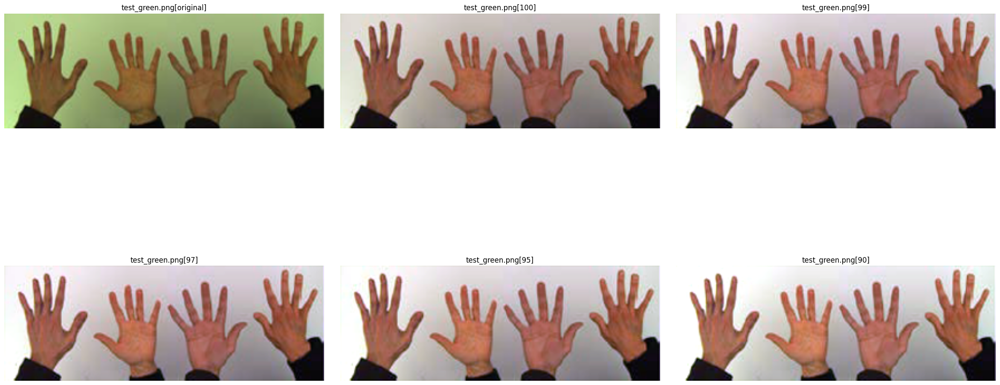

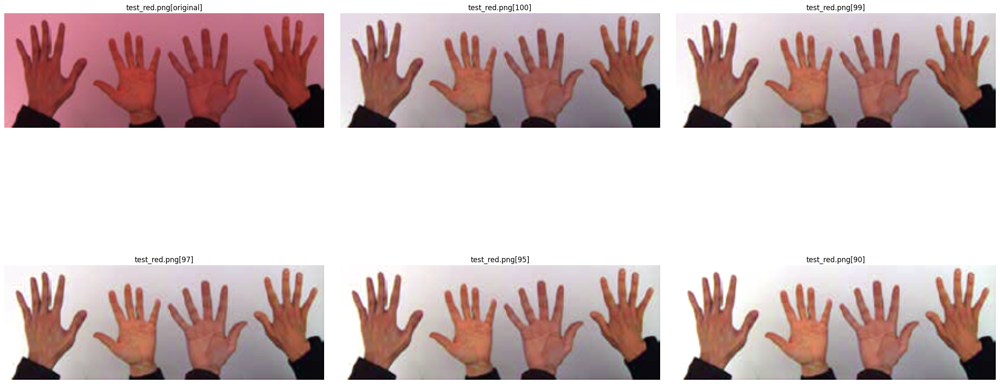

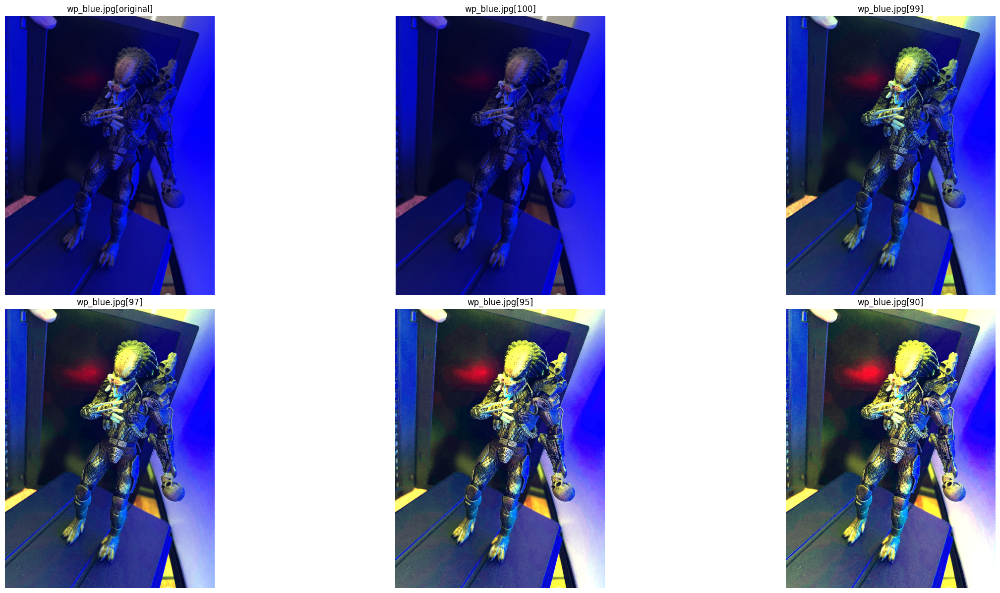

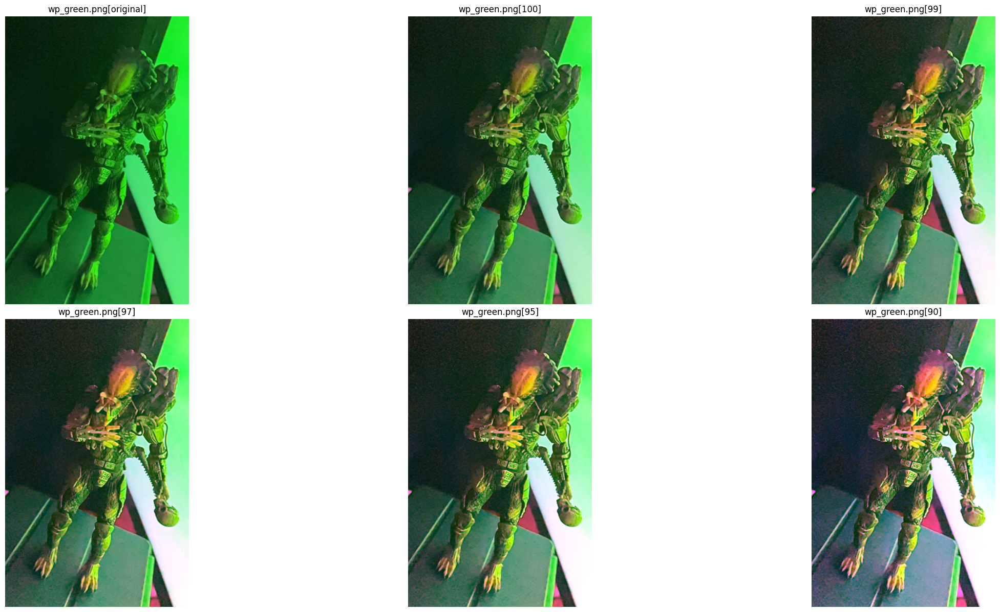

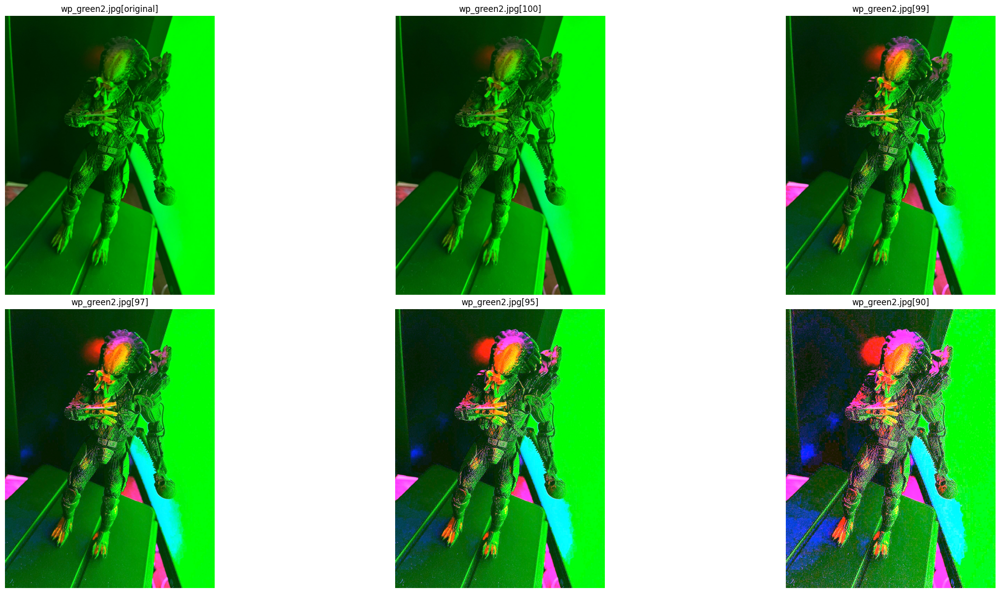

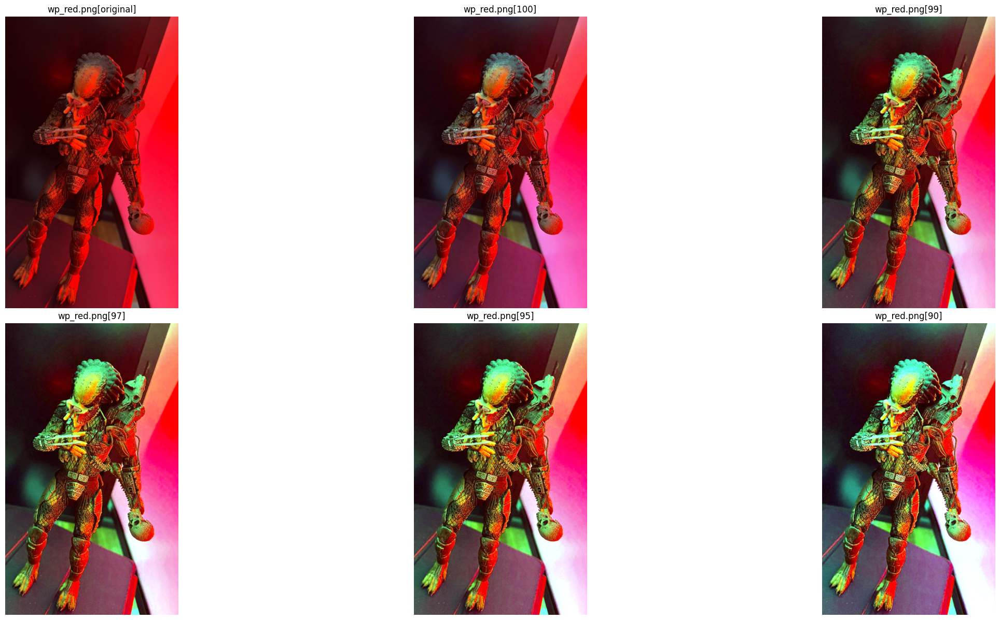

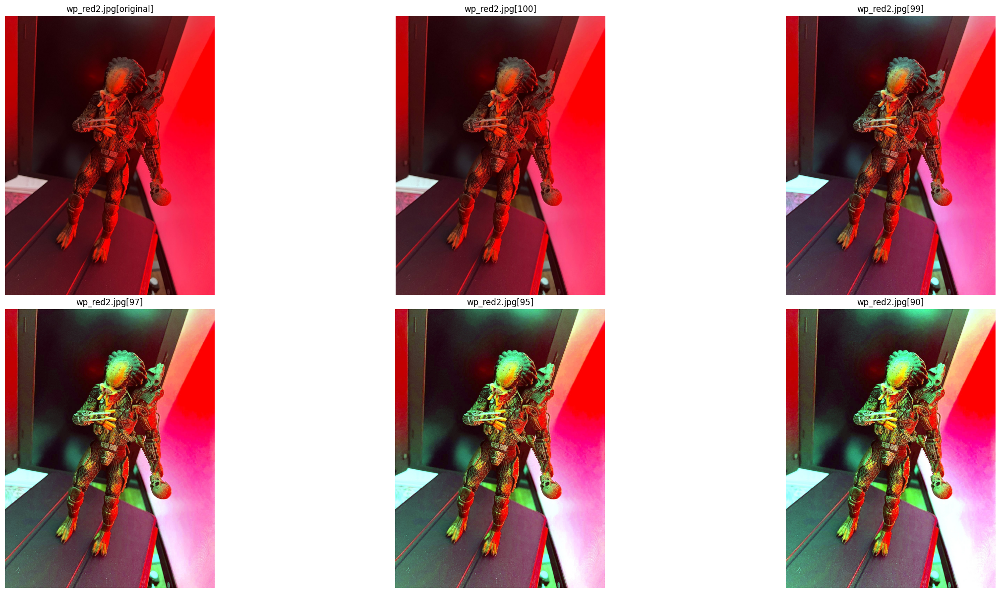

In [8]:
utils.plot_imgs_percentiles('material/parte_1/original', 'material/parte_1/white_patch')

Para las imágenes de las manos parece funcionar bien cualquiera de los percentiles utilizados, así como cuando se tomaban los máximos.

Para las imágenes del alien parece importante encontrar un valor acorde. Para un percentil bajo (90), empezamos a ver saturación para algunos canales. Por ejemplo, para la imagen green2 se observan pixeles magenta por la sobre-saturación de los canales R y B, dado que el percentil 90 genera denominadores muy bajos para dichos canales. Vemos que ese problema se atenúa al tomar percentil 99.

De todos modos este algoritmo resuelve parcialmente el problema para las imágenes donde la iluminación de uno de los canales no es tan pronunciada, pero queda lejos de obtenerse un buen resultado para las otras.   